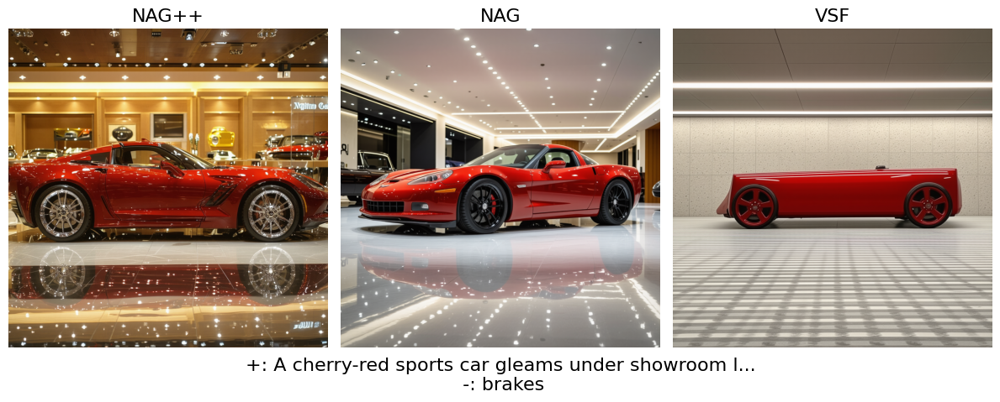

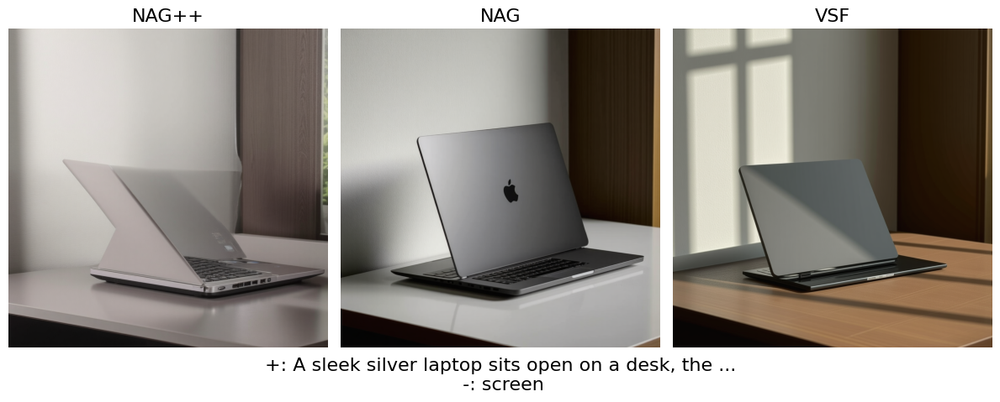

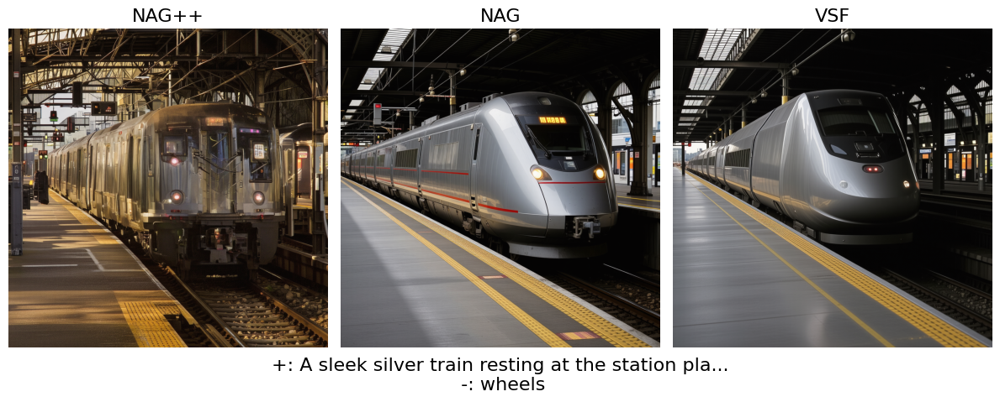

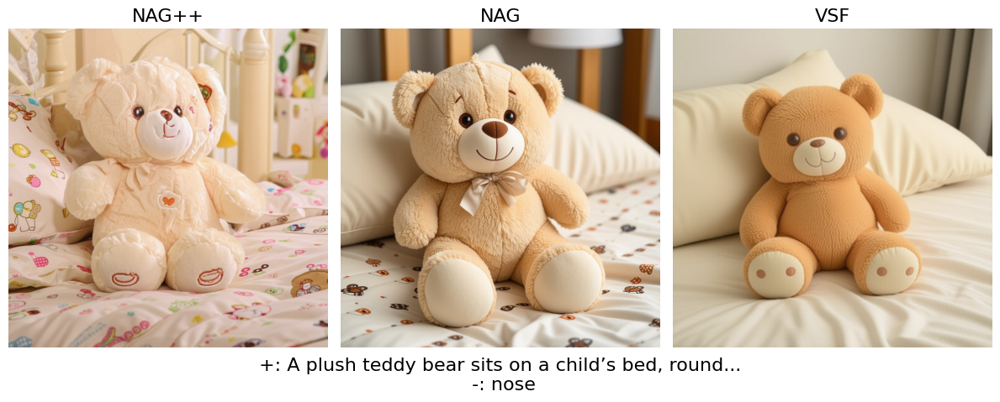

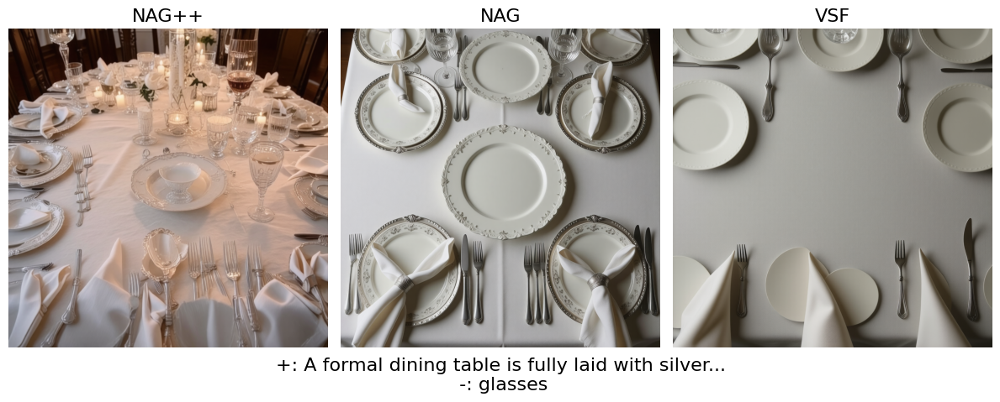

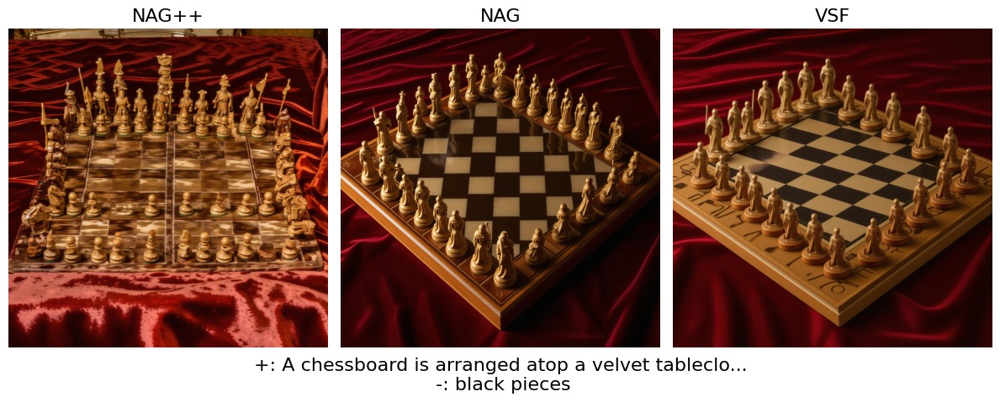

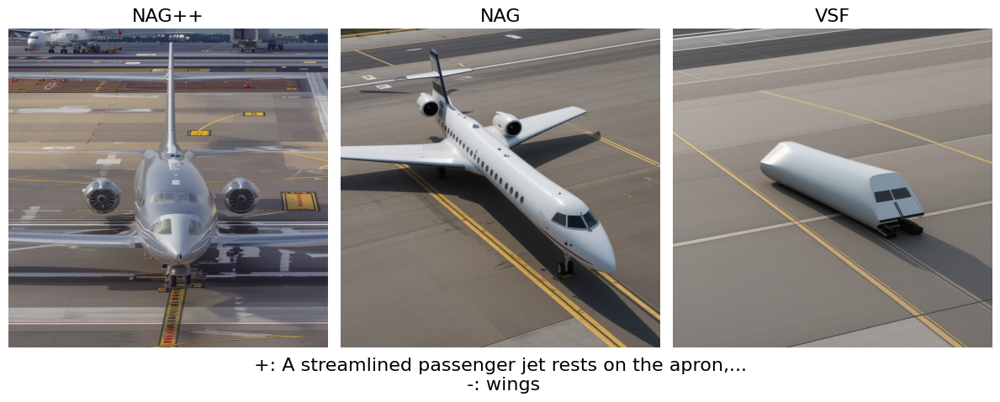

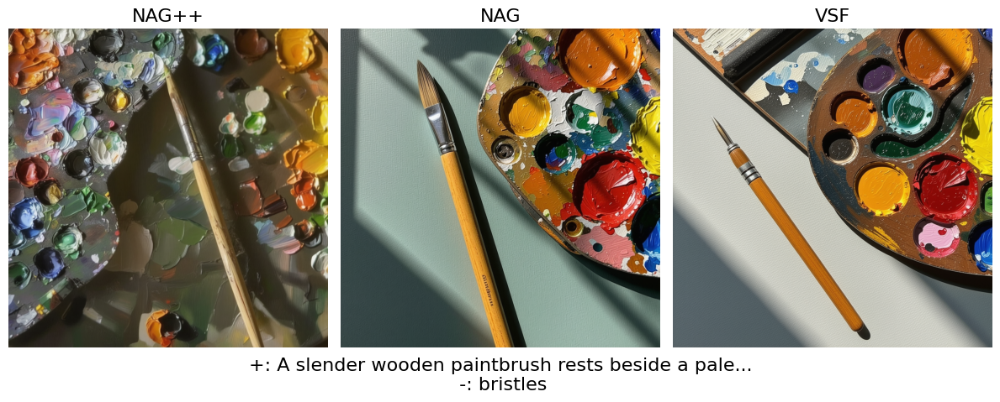

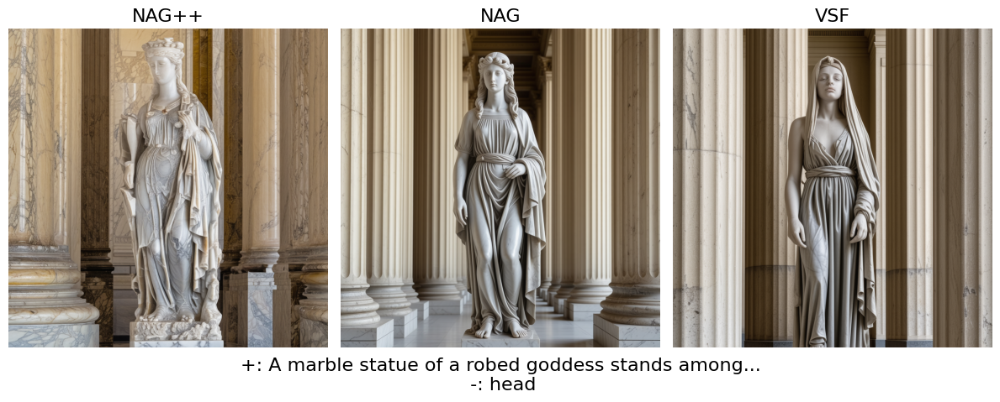

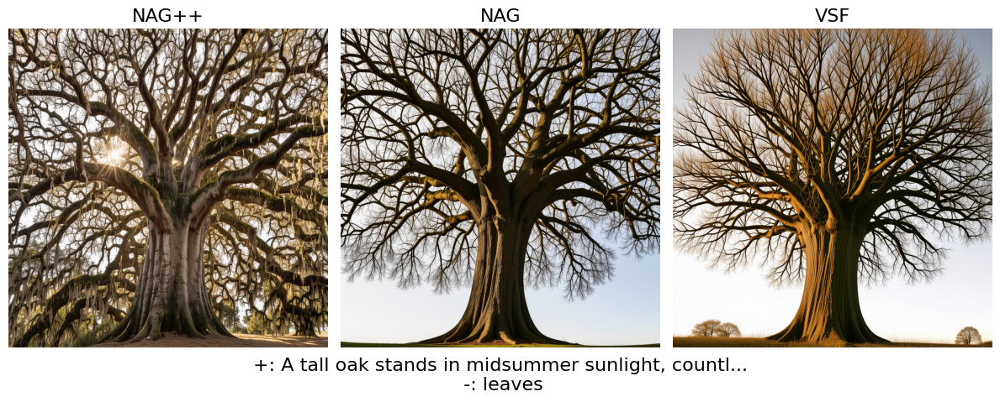

In [26]:
import wandb
import random
import matplotlib.pyplot as plt
from PIL import Image

run_paths = [
    "3dsmile/nag-sweep/ev9af1ou",
    "3dsmile/nag-sweep/ocnpwkei",
    "3dsmile/vsf-sweep/jl578go2",
]

run_name = [
    "NAG++",
    "NAG",
    "VSF"
]
image_key = "img"

api = wandb.Api()
runs = [api.run(path) for path in run_paths]


# Get image dicts per run
image_lists = []
captions = []
for run in runs:
    history = run.history(keys=[image_key], pandas=False)
    images = [row[image_key] for row in history if image_key in row]
    image_lists.append(images)
    captions.append([row[image_key]["caption"] for row in history if image_key in row])

# Get common indices
min_len = min(len(images) for images in image_lists)
random.seed(42)  # For reproducibility
indices = random.sample(range(min_len), 10)
import os
# Display images
os.makedirs("wandb_images", exist_ok=True)
for idx in indices:
    fig, axs = plt.subplots(1, 3, figsize=(12, 5))
    for i, (run, images) in enumerate(zip(runs, image_lists)):
        img_info = images[idx]
        file_path = img_info["path"]
        wandb_file = run.file(file_path)
        local_path = wandb_file.download(replace=True).name
        img = Image.open(local_path)
        axs[i].imshow(img)
        axs[i].axis("off")
        axs[i].set_title(run_name[i], fontsize=16)
    plt.tight_layout()
    pos, neg = captions[0][idx].split("\n")
    pos = pos[:50]
    fig.supxlabel(f"{pos}...\n{neg}", fontsize=16)
    plt.savefig(f"wandb_images/compare_{idx}.png")


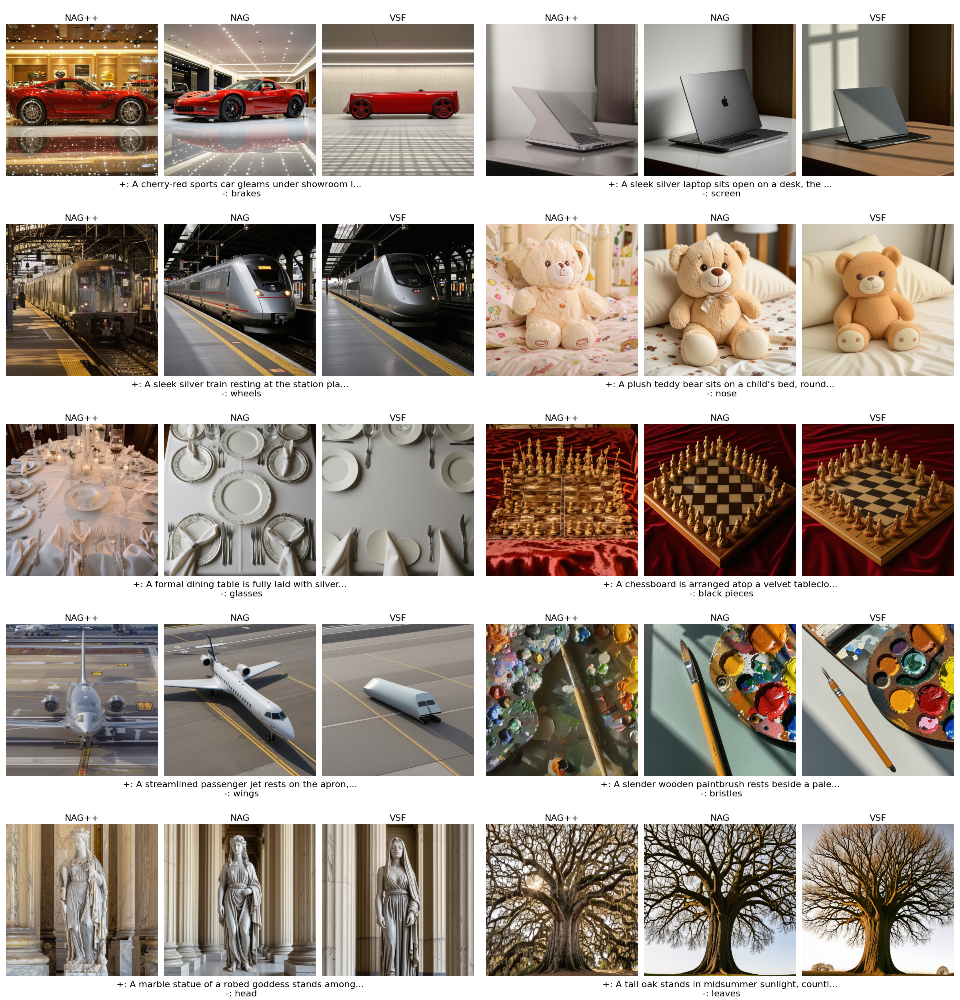

In [27]:
from diffusers import utils
images = [Image.open(f"wandb_images/compare_{idx}.png") for idx in indices]
utils.make_image_grid(images, rows=5, cols=2)

In [2]:
img

{'height': 1024,
 'path': 'media/images/img_151_b0166212cb4a92da8a89.png',
 '_type': 'image-file',
 'caption': '+: A sleek road bicycle leans against an old stone wall, lightweight frame painted crimson and chrome cranks resting above the asphalt.\n -: pedals',
 'size': 2376116,
 'width': 1024,
 'format': 'png',
 'sha256': 'b0166212cb4a92da8a89645adafc54e27e29917735bfbd22f0f73e452a67b4e5'}